# Image Captioning with LSTMs
In the previous exercise you implemented a vanilla RNN and applied it to image captioning. In this notebook you will implement the LSTM update rule and use it for image captioning.

In [1]:
# As usual, a bit of setup
from __future__ import print_function
import time, os, json
import numpy as np
import matplotlib.pyplot as plt

from cs231n.gradient_check import eval_numerical_gradient, eval_numerical_gradient_array
from cs231n.rnn_layers import *
from cs231n.captioning_solver import CaptioningSolver
from cs231n.classifiers.rnn import CaptioningRNN
from cs231n.coco_utils import load_coco_data, sample_coco_minibatch, decode_captions
from cs231n.image_utils import image_from_url

%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

# for auto-reloading external modules
# see http://stackoverflow.com/questions/1907993/autoreload-of-modules-in-ipython
%load_ext autoreload
%autoreload 2

def rel_error(x, y):
    """ returns relative error """
    return np.max(np.abs(x - y) / (np.maximum(1e-8, np.abs(x) + np.abs(y))))

# Load MS-COCO data
As in the previous notebook, we will use the Microsoft COCO dataset for captioning.

In [336]:
# Load COCO data from disk; this returns a dictionary
# We'll work with dimensionality-reduced features for this notebook, but feel
# free to experiment with the original features by changing the flag below.
data = load_coco_data(pca_features=False)

# Print out all the keys and values from the data dictionary
for k, v in data.items():
    if type(v) == np.ndarray:
        print(k, type(v), v.shape, v.dtype)
    else:
        print(k, type(v), len(v))

train_captions <class 'numpy.ndarray'> (400135, 17) int32
train_image_idxs <class 'numpy.ndarray'> (400135,) int32
val_captions <class 'numpy.ndarray'> (195954, 17) int32
val_image_idxs <class 'numpy.ndarray'> (195954,) int32
train_features <class 'numpy.ndarray'> (82783, 4096) float32
val_features <class 'numpy.ndarray'> (40504, 4096) float32
idx_to_word <class 'list'> 1004
word_to_idx <class 'dict'> 1004
train_urls <class 'numpy.ndarray'> (82783,) <U63
val_urls <class 'numpy.ndarray'> (40504,) <U63


In [337]:
data_len = len(data['train_features'])

# LSTM
If you read recent papers, you'll see that many people use a variant on the vanialla RNN called Long-Short Term Memory (LSTM) RNNs. Vanilla RNNs can be tough to train on long sequences due to vanishing and exploding gradiants caused by repeated matrix multiplication. LSTMs solve this problem by replacing the simple update rule of the vanilla RNN with a gating mechanism as follows.

Similar to the vanilla RNN, at each timestep we receive an input $x_t\in\mathbb{R}^D$ and the previous hidden state $h_{t-1}\in\mathbb{R}^H$; the LSTM also maintains an $H$-dimensional *cell state*, so we also receive the previous cell state $c_{t-1}\in\mathbb{R}^H$. The learnable parameters of the LSTM are an *input-to-hidden* matrix $W_x\in\mathbb{R}^{4H\times D}$, a *hidden-to-hidden* matrix $W_h\in\mathbb{R}^{4H\times H}$ and a *bias vector* $b\in\mathbb{R}^{4H}$.

At each timestep we first compute an *activation vector* $a\in\mathbb{R}^{4H}$ as $a=W_xx_t + W_hh_{t-1}+b$. We then divide this into four vectors $a_i,a_f,a_o,a_g\in\mathbb{R}^H$ where $a_i$ consists of the first $H$ elements of $a$, $a_f$ is the next $H$ elements of $a$, etc. We then compute the *input gate* $g\in\mathbb{R}^H$, *forget gate* $f\in\mathbb{R}^H$, *output gate* $o\in\mathbb{R}^H$ and *block input* $g\in\mathbb{R}^H$ as

$$
\begin{align*}
i = \sigma(a_i) \hspace{2pc}
f = \sigma(a_f) \hspace{2pc}
o = \sigma(a_o) \hspace{2pc}
g = \tanh(a_g)
\end{align*}
$$

where $\sigma$ is the sigmoid function and $\tanh$ is the hyperbolic tangent, both applied elementwise.

Finally we compute the next cell state $c_t$ and next hidden state $h_t$ as

$$
c_{t} = f\odot c_{t-1} + i\odot g \hspace{4pc}
h_t = o\odot\tanh(c_t)
$$

where $\odot$ is the elementwise product of vectors.

In the rest of the notebook we will implement the LSTM update rule and apply it to the image captioning task. 

In the code, we assume that data is stored in batches so that $X_t \in \mathbb{R}^{N\times D}$, and will work with *transposed* versions of the parameters: $W_x \in \mathbb{R}^{D \times 4H}$, $W_h \in \mathbb{R}^{H\times 4H}$ so that activations $A \in \mathbb{R}^{N\times 4H}$ can be computed efficiently as $A = X_t W_x + H_{t-1} W_h$

# LSTM: step forward
Implement the forward pass for a single timestep of an LSTM in the `lstm_step_forward` function in the file `cs231n/rnn_layers.py`. This should be similar to the `rnn_step_forward` function that you implemented above, but using the LSTM update rule instead.

Once you are done, run the following to perform a simple test of your implementation. You should see errors around `1e-8` or less.

In [232]:
N, D, H = 3, 4, 5
x = np.linspace(-0.4, 1.2, num=N*D).reshape(N, D)
prev_h = np.linspace(-0.3, 0.7, num=N*H).reshape(N, H)
prev_c = np.linspace(-0.4, 0.9, num=N*H).reshape(N, H)
Wx = np.linspace(-2.1, 1.3, num=4*D*H).reshape(D, 4 * H)
Wh = np.linspace(-0.7, 2.2, num=4*H*H).reshape(H, 4 * H)
b = np.linspace(0.3, 0.7, num=4*H)

next_h, next_c, cache = lstm_step_forward(x, prev_h, prev_c, Wx, Wh, b)

expected_next_h = np.asarray([
    [ 0.24635157,  0.28610883,  0.32240467,  0.35525807,  0.38474904],
    [ 0.49223563,  0.55611431,  0.61507696,  0.66844003,  0.7159181 ],
    [ 0.56735664,  0.66310127,  0.74419266,  0.80889665,  0.858299  ]])
expected_next_c = np.asarray([
    [ 0.32986176,  0.39145139,  0.451556,    0.51014116,  0.56717407],
    [ 0.66382255,  0.76674007,  0.87195994,  0.97902709,  1.08751345],
    [ 0.74192008,  0.90592151,  1.07717006,  1.25120233,  1.42395676]])

print('next_h error: ', rel_error(expected_next_h, next_h))
print('next_c error: ', rel_error(expected_next_c, next_c))

next_h error:  5.70541319671e-09
next_c error:  5.81431230888e-09


# LSTM: step backward
Implement the backward pass for a single LSTM timestep in the function `lstm_step_backward` in the file `cs231n/rnn_layers.py`. Once you are done, run the following to perform numeric gradient checking on your implementation. You should see errors around `1e-6` or less.

In [233]:
np.random.seed(231)

N, D, H = 4, 5, 6
x = np.random.randn(N, D)
prev_h = np.random.randn(N, H)
prev_c = np.random.randn(N, H)
Wx = np.random.randn(D, 4 * H)
Wh = np.random.randn(H, 4 * H)
b = np.random.randn(4 * H)

next_h, next_c, cache = lstm_step_forward(x, prev_h, prev_c, Wx, Wh, b)

dnext_h = np.random.randn(*next_h.shape)
dnext_c = np.random.randn(*next_c.shape)

fx_h = lambda x: lstm_step_forward(x, prev_h, prev_c, Wx, Wh, b)[0]
fh_h = lambda h: lstm_step_forward(x, prev_h, prev_c, Wx, Wh, b)[0]
fc_h = lambda c: lstm_step_forward(x, prev_h, prev_c, Wx, Wh, b)[0]
fWx_h = lambda Wx: lstm_step_forward(x, prev_h, prev_c, Wx, Wh, b)[0]
fWh_h = lambda Wh: lstm_step_forward(x, prev_h, prev_c, Wx, Wh, b)[0]
fb_h = lambda b: lstm_step_forward(x, prev_h, prev_c, Wx, Wh, b)[0]

fx_c = lambda x: lstm_step_forward(x, prev_h, prev_c, Wx, Wh, b)[1]
fh_c = lambda h: lstm_step_forward(x, prev_h, prev_c, Wx, Wh, b)[1]
fc_c = lambda c: lstm_step_forward(x, prev_h, prev_c, Wx, Wh, b)[1]
fWx_c = lambda Wx: lstm_step_forward(x, prev_h, prev_c, Wx, Wh, b)[1]
fWh_c = lambda Wh: lstm_step_forward(x, prev_h, prev_c, Wx, Wh, b)[1]
fb_c = lambda b: lstm_step_forward(x, prev_h, prev_c, Wx, Wh, b)[1]

num_grad = eval_numerical_gradient_array

dx_num = num_grad(fx_h, x, dnext_h) + num_grad(fx_c, x, dnext_c)
dh_num = num_grad(fh_h, prev_h, dnext_h) + num_grad(fh_c, prev_h, dnext_c)
dc_num = num_grad(fc_h, prev_c, dnext_h) + num_grad(fc_c, prev_c, dnext_c)
dWx_num = num_grad(fWx_h, Wx, dnext_h) + num_grad(fWx_c, Wx, dnext_c)
dWh_num = num_grad(fWh_h, Wh, dnext_h) + num_grad(fWh_c, Wh, dnext_c)
db_num = num_grad(fb_h, b, dnext_h) + num_grad(fb_c, b, dnext_c)

dx, dh, dc, dWx, dWh, db = lstm_step_backward(dnext_h, dnext_c, cache)

print('dx error: ', rel_error(dx_num, dx))
print('dh error: ', rel_error(dh_num, dh))
print('dc error: ', rel_error(dc_num, dc))
print('dWx error: ', rel_error(dWx_num, dWx))
print('dWh error: ', rel_error(dWh_num, dWh))
print('db error: ', rel_error(db_num, db))

dx error:  6.33516300253e-10
dh error:  3.39637740906e-10
dc error:  1.5221723979e-10
dWx error:  2.10109609346e-09
dWh error:  9.71229610994e-08
db error:  2.49152204193e-10


# LSTM: forward
In the function `lstm_forward` in the file `cs231n/rnn_layers.py`, implement the `lstm_forward` function to run an LSTM forward on an entire timeseries of data.

When you are done, run the following to check your implementation. You should see an error around `1e-7`.

In [234]:
N, D, H, T = 2, 5, 4, 3
x = np.linspace(-0.4, 0.6, num=N*T*D).reshape(N, T, D)
h0 = np.linspace(-0.4, 0.8, num=N*H).reshape(N, H)
Wx = np.linspace(-0.2, 0.9, num=4*D*H).reshape(D, 4 * H)
Wh = np.linspace(-0.3, 0.6, num=4*H*H).reshape(H, 4 * H)
b = np.linspace(0.2, 0.7, num=4*H)

h, cache = lstm_forward(x, h0, Wx, Wh, b)

expected_h = np.asarray([
 [[ 0.01764008,  0.01823233,  0.01882671,  0.0194232 ],
  [ 0.11287491,  0.12146228,  0.13018446,  0.13902939],
  [ 0.31358768,  0.33338627,  0.35304453,  0.37250975]],
 [[ 0.45767879,  0.4761092,   0.4936887,   0.51041945],
  [ 0.6704845,   0.69350089,  0.71486014,  0.7346449 ],
  [ 0.81733511,  0.83677871,  0.85403753,  0.86935314]]])

print('h error: ', rel_error(expected_h, h))

h error:  8.61053745211e-08


# LSTM: backward
Implement the backward pass for an LSTM over an entire timeseries of data in the function `lstm_backward` in the file `cs231n/rnn_layers.py`. When you are done, run the following to perform numeric gradient checking on your implementation. You should see errors around `1e-7` or less.

In [6]:
from cs231n.rnn_layers import lstm_forward, lstm_backward
np.random.seed(231)

N, D, T, H = 2, 3, 10, 6

x = np.random.randn(N, T, D)
h0 = np.random.randn(N, H)
Wx = np.random.randn(D, 4 * H)
Wh = np.random.randn(H, 4 * H)
b = np.random.randn(4 * H)

out, cache = lstm_forward(x, h0, Wx, Wh, b)

dout = np.random.randn(*out.shape)

dx, dh0, dWx, dWh, db = lstm_backward(dout, cache)

fx = lambda x: lstm_forward(x, h0, Wx, Wh, b)[0]
fh0 = lambda h0: lstm_forward(x, h0, Wx, Wh, b)[0]
fWx = lambda Wx: lstm_forward(x, h0, Wx, Wh, b)[0]
fWh = lambda Wh: lstm_forward(x, h0, Wx, Wh, b)[0]
fb = lambda b: lstm_forward(x, h0, Wx, Wh, b)[0]

dx_num = eval_numerical_gradient_array(fx, x, dout)
dh0_num = eval_numerical_gradient_array(fh0, h0, dout)
dWx_num = eval_numerical_gradient_array(fWx, Wx, dout)
dWh_num = eval_numerical_gradient_array(fWh, Wh, dout)
db_num = eval_numerical_gradient_array(fb, b, dout)

print('dx error: ', rel_error(dx_num, dx))
print('dh0 error: ', rel_error(dh0_num, dh0))
print('dWx error: ', rel_error(dWx_num, dWx))
print('dWh error: ', rel_error(dWh_num, dWh))
print('db error: ', rel_error(db_num, db))

dx error:  7.83850081068e-09
dh0 error:  2.46909258008e-08
dWx error:  4.748336089e-09
dWh error:  1.0424408356e-06
db error:  1.91527296761e-09


# LSTM captioning model

Now that you have implemented an LSTM, update the implementation of the `loss` method of the `CaptioningRNN` class in the file `cs231n/classifiers/rnn.py` to handle the case where `self.cell_type` is `lstm`. This should require adding less than 10 lines of code.

Once you have done so, run the following to check your implementation. You should see a difference of less than `1e-10`.

In [7]:
N, D, W, H = 10, 20, 30, 40
word_to_idx = {'<NULL>': 0, 'cat': 2, 'dog': 3}
V = len(word_to_idx)
T = 13

model = CaptioningRNN(word_to_idx,
          input_dim=D,
          wordvec_dim=W,
          hidden_dim=H,
          cell_type='lstm',
          dtype=np.float64)

# Set all model parameters to fixed values
for k, v in model.params.items():
  model.params[k] = np.linspace(-1.4, 1.3, num=v.size).reshape(*v.shape)

features = np.linspace(-0.5, 1.7, num=N*D).reshape(N, D)
captions = (np.arange(N * T) % V).reshape(N, T)

loss, grads = model.loss(features, captions)
expected_loss = 9.82445935443

print('loss: ', loss)
print('expected loss: ', expected_loss)
print('difference: ', abs(loss - expected_loss))

loss:  9.82445935443
expected loss:  9.82445935443
difference:  2.26130225656e-12


# Overfit LSTM captioning model
Run the following to overfit an LSTM captioning model on the same small dataset as we used for the RNN previously. You should see losses less than 0.5.

(Iteration 1 / 100) loss: 79.551150
(Iteration 11 / 100) loss: 43.829101
(Iteration 21 / 100) loss: 30.062628
(Iteration 31 / 100) loss: 14.020008
(Iteration 41 / 100) loss: 6.003688
(Iteration 51 / 100) loss: 1.852765
(Iteration 61 / 100) loss: 0.638211
(Iteration 71 / 100) loss: 0.283636
(Iteration 81 / 100) loss: 0.238089
(Iteration 91 / 100) loss: 0.124782


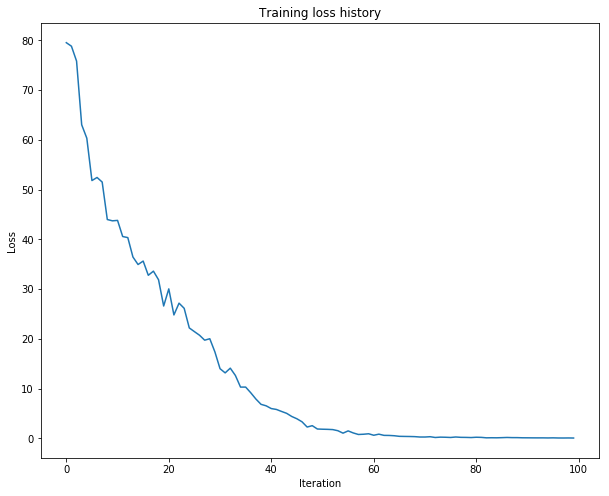

In [11]:
np.random.seed(231)

small_data = load_coco_data(max_train=50)

small_lstm_model = CaptioningRNN(
          cell_type='lstm',
          word_to_idx=data['word_to_idx'],
          input_dim=data['train_features'].shape[1],
          hidden_dim=512,
          wordvec_dim=256,
          dtype=np.float32,
        )

small_lstm_solver = CaptioningSolver(small_lstm_model, small_data,
           update_rule='adam',
           num_epochs=50,
           batch_size=25,
           optim_config={
             'learning_rate': 5e-3,
           },
           lr_decay=0.995,
           verbose=True, print_every=10,
         )

small_lstm_solver.train()

# Plot the training losses
plt.plot(small_lstm_solver.loss_history)
plt.xlabel('Iteration')
plt.ylabel('Loss')
plt.title('Training loss history')
plt.show()

(Iteration 1 / 500) loss: 79.465043
(Iteration 11 / 500) loss: 53.080942
(Iteration 21 / 500) loss: 48.534770
(Iteration 31 / 500) loss: 46.264412
(Iteration 41 / 500) loss: 45.413639
(Iteration 51 / 500) loss: 41.301144
(Iteration 61 / 500) loss: 38.225651
(Iteration 71 / 500) loss: 40.433956
(Iteration 81 / 500) loss: 38.005524
(Iteration 91 / 500) loss: 34.428787
(Iteration 101 / 500) loss: 35.694081
(Iteration 111 / 500) loss: 32.648311
(Iteration 121 / 500) loss: 33.922642
(Iteration 131 / 500) loss: 32.655547
(Iteration 141 / 500) loss: 30.771442
(Iteration 151 / 500) loss: 29.171651
(Iteration 161 / 500) loss: 30.322795
(Iteration 171 / 500) loss: 29.337867
(Iteration 181 / 500) loss: 27.939490
(Iteration 191 / 500) loss: 27.581841
(Iteration 201 / 500) loss: 29.038954
(Iteration 211 / 500) loss: 26.934863
(Iteration 221 / 500) loss: 26.747744
(Iteration 231 / 500) loss: 26.975986
(Iteration 241 / 500) loss: 24.426779
(Iteration 251 / 500) loss: 26.269215
(Iteration 261 / 500) l

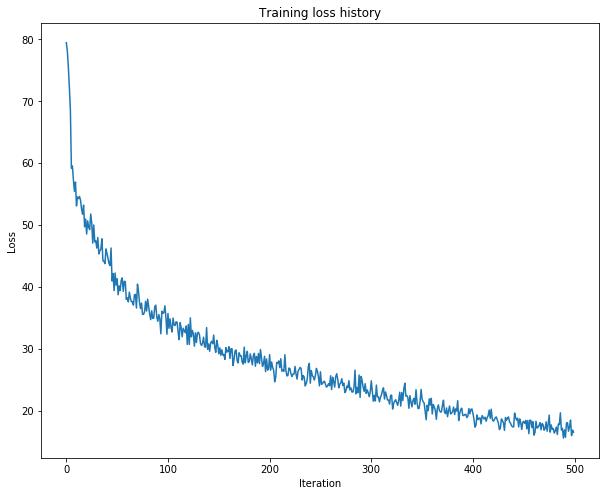

In [12]:
np.random.seed(231)

data1 = load_coco_data(max_train=5000)

lstm_model = CaptioningRNN(
          cell_type='lstm',
          word_to_idx=data['word_to_idx'],
          input_dim=data['train_features'].shape[1],
          hidden_dim=400,
          wordvec_dim=100,
          dtype=np.float32,
        )

lstm_solver = CaptioningSolver(lstm_model,data1,
           update_rule='adam',
           num_epochs=10,
           batch_size=100,
           optim_config={
             'learning_rate': 5e-3,
           },
           #lr_decay=0.995,
           verbose=True, print_every=10,
         )
lstm_solver.train()

# Plot the training losses
plt.plot(lstm_solver.loss_history)
plt.xlabel('Iteration')
plt.ylabel('Loss')
plt.title('Training loss history')
plt.show()

# LSTM test-time sampling
Modify the `sample` method of the `CaptioningRNN` class to handle the case where `self.cell_type` is `lstm`. This should take fewer than 10 lines of code.

When you are done run the following to sample from your overfit LSTM model on some training and validation set samples.

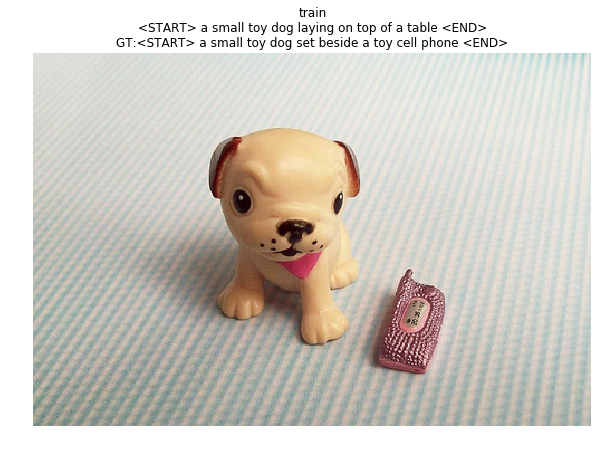

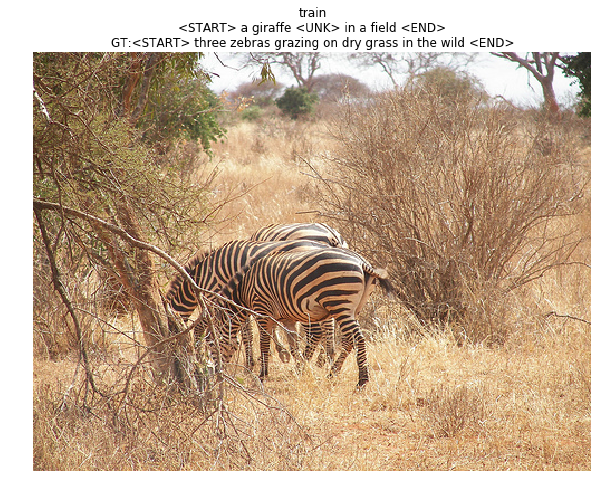

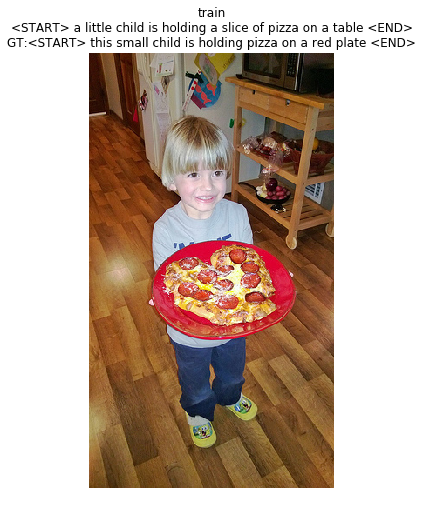

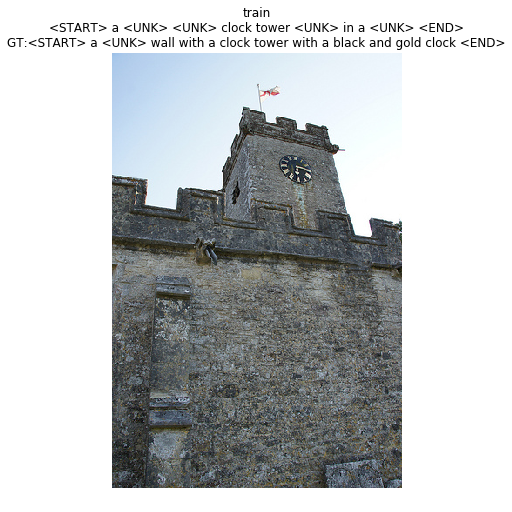

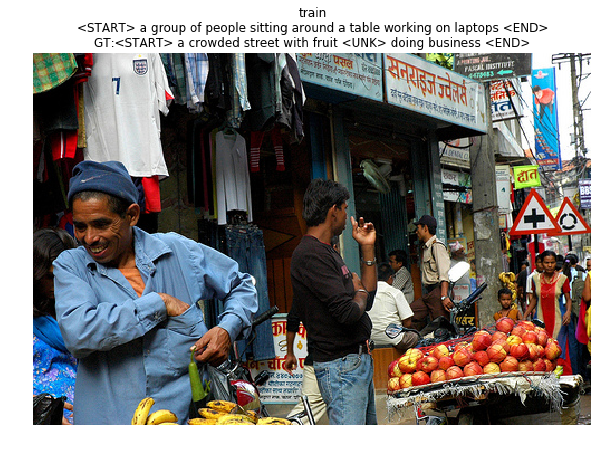

...

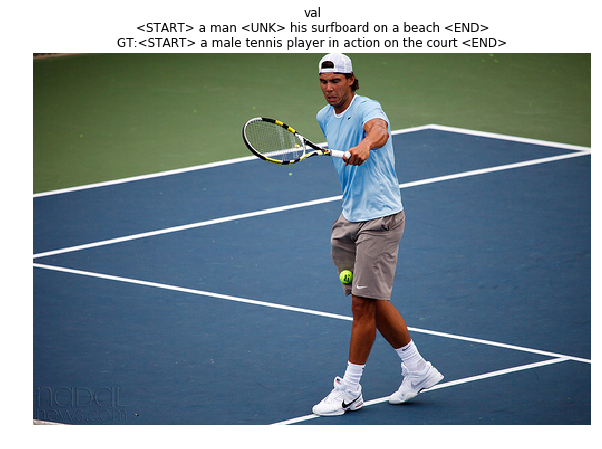

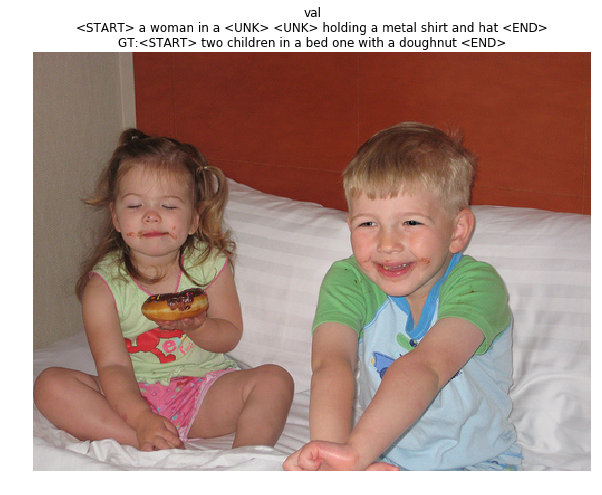

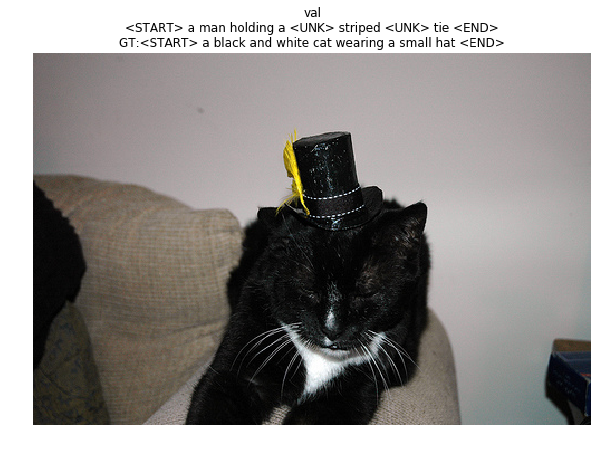

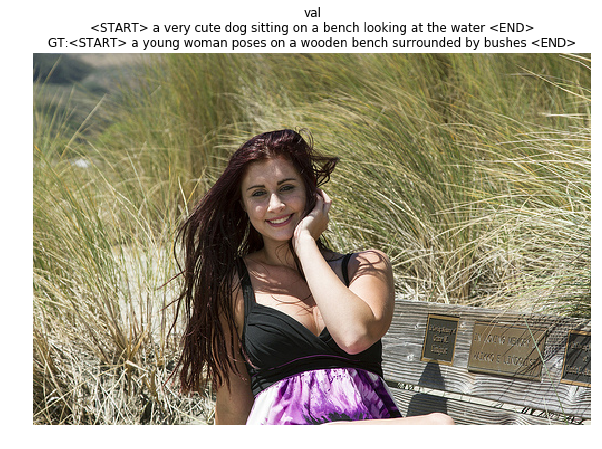

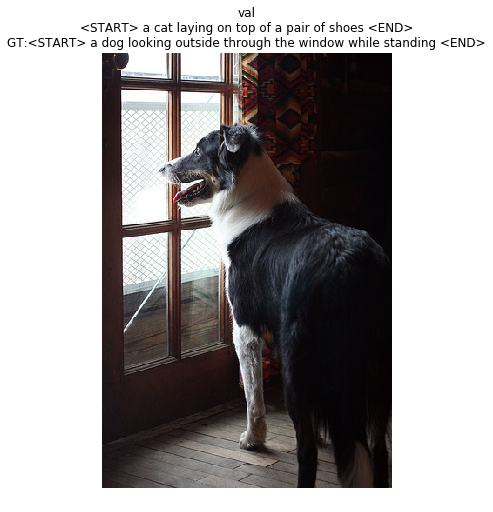

In [13]:
for split in ['train', 'val']:
    minibatch = sample_coco_minibatch(data1, split=split, batch_size=10)
    gt_captions, features, urls = minibatch
    gt_captions = decode_captions(gt_captions, data['idx_to_word'])

    sample_captions = lstm_model.sample(features)
    sample_captions = decode_captions(sample_captions, data['idx_to_word'])

    for gt_caption, sample_caption, url in zip(gt_captions, sample_captions, urls):
        plt.imshow(image_from_url(url))
        plt.title('%s\n%s\nGT:%s' % (split, sample_caption, gt_caption))
        plt.axis('off')
        plt.show()

# Extra Credit: Train a good captioning model!
Using the pieces you have implemented in this and the previous notebook, try to train a captioning model that gives decent qualitative results (better than the random garbage you saw with the overfit models) when sampling on the validation set. You can subsample the training set if you want; we just want to see samples on the validation set that are better than random.

In addition to qualitatively evaluating your model by inspecting its results, you can also quantitatively evaluate your model using the BLEU unigram precision metric. We'll give you a small amount of extra credit if you can train a model that achieves a BLEU unigram score of >0.3. BLEU scores range from 0 to 1; the closer to 1, the better. Here's a reference to the [paper](http://www.aclweb.org/anthology/P02-1040.pdf) that introduces BLEU if you're interested in learning more about how it works.

Feel free to use PyTorch or TensorFlow for this section if you'd like to train faster on a GPU... though you can definitely get above 0.3 using your Numpy code. We're providing you the evaluation code that is compatible with the Numpy model as defined above... you should be able to adapt it for TensorFlow/PyTorch if you go that route.

In [34]:
import nltk
def BLEU_score(gt_caption, sample_caption):
    """
    gt_caption: string, ground-truth caption
    sample_caption: string, your model's predicted caption
    Returns unigram BLEU score.
    """
    reference = [x for x in gt_caption.split(' ') 
                 if ('<END>' not in x and '<START>' not in x and '<UNK>' not in x)]
    hypothesis = [x for x in sample_caption.split(' ') 
                  if ('<END>' not in x and '<START>' not in x and '<UNK>' not in x)]
    BLEUscore = nltk.translate.bleu_score.sentence_bleu([reference], hypothesis, weights = [1])
    return BLEUscore

def evaluate_model(model):
    """
    model: CaptioningRNN model
    Prints unigram BLEU score averaged over 1000 training and val examples.
    """
    BLEUscores = {}
    for split in ['train', 'val']:
        minibatch = sample_coco_minibatch(data, split=split, batch_size=1000)
        gt_captions, features, urls = minibatch
        gt_captions = decode_captions(gt_captions, data['idx_to_word'])

        sample_captions = model.sample(features)
        sample_captions = decode_captions(sample_captions, data['idx_to_word'])

        total_score = 0.0
        for gt_caption, sample_caption, url in zip(gt_captions, sample_captions, urls):
            total_score += BLEU_score(gt_caption, sample_caption)

        
        BLEUscores[split] = total_score / len(sample_captions)

    for split in BLEUscores:
        print('Average BLEU score for %s: %f' % (split, BLEUscores[split]))

In [38]:
evaluate_model(lstm_model)

Average BLEU score for train: 0.266583
Average BLEU score for val: 0.263538


In [26]:
captions,features,urls = sample_coco_minibatch(data, batch_size=1000)
captions

array([[  1,  16,  29, ...,   0,   0,   0],
       [  1,   4, 782, ...,   0,   0,   0],
       [  1,   4,  23, ...,   0,   0,   0],
       ..., 
       [  1,   4, 125, ...,   0,   0,   0],
       [  1,   4, 263, ...,   0,   0,   0],
       [  1,  12, 280, ...,   3,   2,   0]], dtype=int32)

In [27]:
import tensorflow as tf
import tensorlayer as tl


In [28]:
features = tf.placeholder(tf.float32,[None,512])
captions_in = tf.placeholder(tf.float32,[None,17])
captions_out = tf.placeholder(tf.float32,[None,17])
logits = my_model(captions_in,seq_length)

  [TL] EmbeddingInputlayer embedding_layer: (1004, 128)


TypeError: Value passed to parameter 'indices' has DataType float32 not in list of allowed values: int32, int64

# TensorFlow Implementation

In [4]:
import tensorflow as tf

In [307]:
HIDDEN_DIMS = 512
VOCAB_SIZE = len(data['word_to_idx'])
IMAGE_DIM = 512
WORD2VEC_DIM = 256
BATCH_SIZE = 100
LR = 5e-3
START = data['word_to_idx']['<START>']
NULL = data['word_to_idx']['<NULL>']
END = data['word_to_idx']['<END>']

In [338]:
small_data = load_coco_data(max_train=5000)
data_len = len(small_data['train_features'])

In [339]:
def reset_graph():
    if 'sess' in globals() and sess:
        sess.close()
    tf.reset_default_graph()

In [340]:
def build_model(
    hidden_size = HIDDEN_DIMS,#dimensions of lstm gates
    num_steps = 16,#maximum number of words in caption
    image_size = IMAGE_DIM,#dimensions of image features
    vocab_size = VOCAB_SIZE,
    embedding_size = WORD2VEC_DIM,
    lr = LR,
    batch_size = BATCH_SIZE):
    
    reset_graph()
    
    image_features = tf.placeholder(tf.float32,[batch_size,image_size],name = 'image_features')
    
    captions_in = tf.placeholder(tf.int32,[None,num_steps],name='captions_in')
    
    captions_out = tf.placeholder(tf.int32,[None,num_steps],name='captions_out')
    
    #initial value of c gate
    c0 = tf.placeholder_with_default(tf.zeros([batch_size,hidden_size]), [batch_size,hidden_size], name=None)
    
    with tf.variable_scope('image_embeddings'):
        W_proj = tf.get_variable('W_proj',[image_size,hidden_size],initializer = tf.random_normal_initializer(stddev=0.01))
        b_proj = tf.get_variable('b_proj',[hidden_size])
    
    image_embeddings = tf.matmul(image_features,W_proj) + b_proj
    #initial value of hidden state
    h0 = tf.placeholder_with_default(image_embeddings,shape=[batch_size,hidden_size], name=None)
    
    with tf.variable_scope('embeddings'):
        embeddings = tf.get_variable('embeddings',[vocab_size,embedding_size],initializer = tf.random_normal_initializer(stddev=0.01))
    rnn_inputs = tf.nn.embedding_lookup(embeddings,captions_in)
    
    cell = tf.contrib.rnn.LSTMCell(hidden_size,state_is_tuple=True)
    init_state = tf.nn.rnn_cell.LSTMStateTuple(c0,h0)
    rnn_outputs, final_state = tf.nn.dynamic_rnn(cell,rnn_inputs,initial_state = init_state)
    
    with tf.variable_scope('softmax'):
        W = tf.get_variable('W',[hidden_size,vocab_size],initializer = tf.random_normal_initializer(stddev=0.01))
        b = tf.get_variable('b',[vocab_size])
   
    rnn_outputs = tf.reshape(rnn_outputs,[-1,hidden_size])
    logits = tf.reshape(tf.matmul(rnn_outputs,W),[-1,num_steps,vocab_size]) + b
    logits_reshaped = tf.reshape(logits,[-1,vocab_size])
    
    captions_out_reshaped = tf.reshape(captions_out,[-1])
    mask = tf.not_equal(captions_out_reshaped,NULL)
    predictions = tf.nn.softmax(logits_reshaped)
    
    cross_entropy = tf.nn.sparse_softmax_cross_entropy_with_logits(logits = logits_reshaped, labels = captions_out_reshaped)
    total_loss = tf.reduce_mean(tf.where(mask,cross_entropy,tf.zeros_like(cross_entropy)))
    global_step = tf.Variable(0, trainable=False)
    
    learning_rate = tf.train.exponential_decay(LR, global_step,
                                           200, 0.995, staircase=True)
    train_step = tf.train.AdamOptimizer(learning_rate).minimize(total_loss,global_step)
    
    return dict(
        image_features = image_features,
        captions_in = captions_in,
        captions_out = captions_out,
        c0 = c0,
        h0 = h0,
        final_state = final_state,
        total_loss = total_loss,
        train_step = train_step,
        preds = predictions,
        cross_entropy = cross_entropy,
        global_step = global_step,
        saver = tf.train.Saver())

In [341]:
g = build_model()

In [285]:
VOCAB_SIZE

1004

In [286]:
minibatch = sample_coco_minibatch(small_data, split='train', batch_size=5)
captions,features,_ = minibatch
captions[0]

array([  1,   7, 180,  11,  22,  10,  11,   5,   7, 577, 742, 519,   2,
         0,   0,   0,   0], dtype=int32)

In [342]:
def train(g,num_iterations,num_steps = 16,batch_size = BATCH_SIZE,verbose = True):
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        ckpt = tf.train.get_checkpoint_state(os.path.dirname('checkpoints/'))
        if ckpt and ckpt.model_checkpoint_path:
            g['saver'].restore(sess, ckpt.model_checkpoint_path)
        training_losses = []
        training_loss = 0
        start = sess.run(g['global_step'])
        for i in range(start,num_iterations):
            minibatch = sample_coco_minibatch(small_data, split='train', batch_size=batch_size)
            captions,features,_ = minibatch
            feed_dict = {g['image_features']:features,g['captions_in']:captions[:,:-1],g['captions_out']:captions[:,1:]}
            loss,_,preds,ce = sess.run([g['total_loss'],g['train_step'],g['preds'],g['cross_entropy']],feed_dict)
            captions_flat = captions[:,1:].reshape(-1,)
            mask = (captions_flat != 0)
            loser = -np.mean(mask*np.log(preds[np.arange( 100*16), captions_flat]))
            training_loss += loss
            if (i+1)%10 == 0:
                if verbose:
                    print('Training Loss at Iteration ',(i+1),' : ' ,training_loss/10)
                training_losses.append(training_loss/10)
                training_loss = 0
                g['saver'].save(sess,"checkpoints/itr"+str(i+1))
        return training_losses

In [343]:
training_losses = train(g,800)

Training Loss at Iteration  10  :  4.14632866383
Training Loss at Iteration  20  :  3.36630899906
Training Loss at Iteration  30  :  3.09329948425
Training Loss at Iteration  40  :  2.8974789381
Training Loss at Iteration  50  :  2.75645787716
Training Loss at Iteration  60  :  2.60385189056
Training Loss at Iteration  70  :  2.49646711349
Training Loss at Iteration  80  :  2.3972083807
Training Loss at Iteration  90  :  2.28826715946
Training Loss at Iteration  100  :  2.27239305973
Training Loss at Iteration  110  :  2.19094393253
Training Loss at Iteration  120  :  2.17398538589
Training Loss at Iteration  130  :  2.08049764633
Training Loss at Iteration  140  :  2.00201078653
Training Loss at Iteration  150  :  2.01121839285
Training Loss at Iteration  160  :  1.91440359354
Training Loss at Iteration  170  :  1.9357659936
Training Loss at Iteration  180  :  1.85889697075
Training Loss at Iteration  190  :  1.86623263359
Training Loss at Iteration  200  :  1.76418399811
Training Los

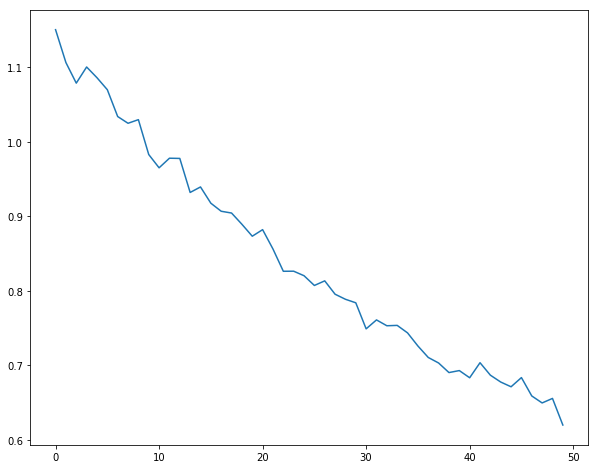

In [226]:
plt.plot(training_losses)
plt.show()

In [344]:
def sample(g,checkpoint,features,vocab_size = VOCAB_SIZE):
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        g['saver'].restore(sess,checkpoint)
        print(features.shape)
        captions = []
        for i in range(features.shape[0]):
            current_word = START
            caption = [current_word]
            state = None
            for _ in range(30):
                feed_dict = {g['image_features']:[features[i]],g['captions_in']:[[current_word]]}
                if state is not None:
                    feed_dict[g['c0']] = state[0]
                    feed_dict[g['h0']] = state[1]
                preds,state = sess.run([g['preds'],g['final_state']],feed_dict)
                current_word = np.random.choice(vocab_size,p = preds[0])
                caption.append(current_word)
                if current_word == END:
                    break
            words = map(lambda x: small_data['idx_to_word'][x], caption )
            captions.append(' '.join(words))
        return captions

In [345]:
g = build_model(num_steps=1,batch_size = 1)

In [316]:
checkpoint = 'checkpoints/itr400'
for split in ['train', 'val']:
    minibatch = sample_coco_minibatch(small_data, split=split, batch_size=2)
    gt_captions, features, urls = minibatch
    gt_captions = decode_captions(gt_captions, data['idx_to_word'])
    
    captions = sample(g,checkpoint,features)
    #for i in range(10):
        #caption = sample(g,checkpoint,features[i])
        #captions.append(caption)
    for gt_caption, sample_caption, url in zip(gt_captions, captions, urls):
        plt.imshow(image_from_url(url))
        plt.title('%s\n%s\nGT:%s' % (split, sample_caption, gt_caption))
        plt.axis('off')
        plt.show()

INFO:tensorflow:Restoring parameters from checkpoints/itr100


NotFoundError: Unsuccessful TensorSliceReader constructor: Failed to find any matching files for checkpoints/itr100
	 [[Node: save/RestoreV2_1 = RestoreV2[dtypes=[DT_FLOAT], _device="/job:localhost/replica:0/task:0/cpu:0"](_arg_save/Const_0_0, save/RestoreV2_1/tensor_names, save/RestoreV2_1/shape_and_slices)]]

Caused by op 'save/RestoreV2_1', defined at:
  File "/home/kabir/anaconda3/lib/python3.6/runpy.py", line 193, in _run_module_as_main
    "__main__", mod_spec)
  File "/home/kabir/anaconda3/lib/python3.6/runpy.py", line 85, in _run_code
    exec(code, run_globals)
  File "/home/kabir/anaconda3/lib/python3.6/site-packages/ipykernel/__main__.py", line 3, in <module>
    app.launch_new_instance()
  File "/home/kabir/anaconda3/lib/python3.6/site-packages/traitlets/config/application.py", line 658, in launch_instance
    app.start()
  File "/home/kabir/anaconda3/lib/python3.6/site-packages/ipykernel/kernelapp.py", line 474, in start
    ioloop.IOLoop.instance().start()
  File "/home/kabir/anaconda3/lib/python3.6/site-packages/zmq/eventloop/ioloop.py", line 177, in start
    super(ZMQIOLoop, self).start()
  File "/home/kabir/anaconda3/lib/python3.6/site-packages/tornado/ioloop.py", line 887, in start
    handler_func(fd_obj, events)
  File "/home/kabir/anaconda3/lib/python3.6/site-packages/tornado/stack_context.py", line 275, in null_wrapper
    return fn(*args, **kwargs)
  File "/home/kabir/anaconda3/lib/python3.6/site-packages/zmq/eventloop/zmqstream.py", line 440, in _handle_events
    self._handle_recv()
  File "/home/kabir/anaconda3/lib/python3.6/site-packages/zmq/eventloop/zmqstream.py", line 472, in _handle_recv
    self._run_callback(callback, msg)
  File "/home/kabir/anaconda3/lib/python3.6/site-packages/zmq/eventloop/zmqstream.py", line 414, in _run_callback
    callback(*args, **kwargs)
  File "/home/kabir/anaconda3/lib/python3.6/site-packages/tornado/stack_context.py", line 275, in null_wrapper
    return fn(*args, **kwargs)
  File "/home/kabir/anaconda3/lib/python3.6/site-packages/ipykernel/kernelbase.py", line 276, in dispatcher
    return self.dispatch_shell(stream, msg)
  File "/home/kabir/anaconda3/lib/python3.6/site-packages/ipykernel/kernelbase.py", line 228, in dispatch_shell
    handler(stream, idents, msg)
  File "/home/kabir/anaconda3/lib/python3.6/site-packages/ipykernel/kernelbase.py", line 390, in execute_request
    user_expressions, allow_stdin)
  File "/home/kabir/anaconda3/lib/python3.6/site-packages/ipykernel/ipkernel.py", line 196, in do_execute
    res = shell.run_cell(code, store_history=store_history, silent=silent)
  File "/home/kabir/anaconda3/lib/python3.6/site-packages/ipykernel/zmqshell.py", line 501, in run_cell
    return super(ZMQInteractiveShell, self).run_cell(*args, **kwargs)
  File "/home/kabir/anaconda3/lib/python3.6/site-packages/IPython/core/interactiveshell.py", line 2717, in run_cell
    interactivity=interactivity, compiler=compiler, result=result)
  File "/home/kabir/anaconda3/lib/python3.6/site-packages/IPython/core/interactiveshell.py", line 2821, in run_ast_nodes
    if self.run_code(code, result):
  File "/home/kabir/anaconda3/lib/python3.6/site-packages/IPython/core/interactiveshell.py", line 2881, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-315-20527c572067>", line 1, in <module>
    g = build_model(num_steps=1,batch_size = 1)
  File "<ipython-input-310-d1f7bce06a96>", line 61, in build_model
    saver = tf.train.Saver())
  File "/home/kabir/anaconda3/lib/python3.6/site-packages/tensorflow/python/training/saver.py", line 1139, in __init__
    self.build()
  File "/home/kabir/anaconda3/lib/python3.6/site-packages/tensorflow/python/training/saver.py", line 1170, in build
    restore_sequentially=self._restore_sequentially)
  File "/home/kabir/anaconda3/lib/python3.6/site-packages/tensorflow/python/training/saver.py", line 691, in build
    restore_sequentially, reshape)
  File "/home/kabir/anaconda3/lib/python3.6/site-packages/tensorflow/python/training/saver.py", line 407, in _AddRestoreOps
    tensors = self.restore_op(filename_tensor, saveable, preferred_shard)
  File "/home/kabir/anaconda3/lib/python3.6/site-packages/tensorflow/python/training/saver.py", line 247, in restore_op
    [spec.tensor.dtype])[0])
  File "/home/kabir/anaconda3/lib/python3.6/site-packages/tensorflow/python/ops/gen_io_ops.py", line 640, in restore_v2
    dtypes=dtypes, name=name)
  File "/home/kabir/anaconda3/lib/python3.6/site-packages/tensorflow/python/framework/op_def_library.py", line 767, in apply_op
    op_def=op_def)
  File "/home/kabir/anaconda3/lib/python3.6/site-packages/tensorflow/python/framework/ops.py", line 2506, in create_op
    original_op=self._default_original_op, op_def=op_def)
  File "/home/kabir/anaconda3/lib/python3.6/site-packages/tensorflow/python/framework/ops.py", line 1269, in __init__
    self._traceback = _extract_stack()

NotFoundError (see above for traceback): Unsuccessful TensorSliceReader constructor: Failed to find any matching files for checkpoints/itr100
	 [[Node: save/RestoreV2_1 = RestoreV2[dtypes=[DT_FLOAT], _device="/job:localhost/replica:0/task:0/cpu:0"](_arg_save/Const_0_0, save/RestoreV2_1/tensor_names, save/RestoreV2_1/shape_and_slices)]]


In [346]:
import nltk

checkpoint = 'checkpoints/itr800'
def BLEU_score(gt_caption, sample_caption):
    """
    gt_caption: string, ground-truth caption
    sample_caption: string, your model's predicted caption
    Returns unigram BLEU score.
    """
    reference = [x for x in gt_caption.split(' ') 
                 if ('<END>' not in x and '<START>' not in x and '<UNK>' not in x)]
    hypothesis = [x for x in sample_caption.split(' ') 
                  if ('<END>' not in x and '<START>' not in x and '<UNK>' not in x)]
    BLEUscore = nltk.translate.bleu_score.sentence_bleu([reference], hypothesis, weights = [1])
    return BLEUscore

def evaluate_model():
    """
    model: CaptioningRNN model
    Prints unigram BLEU score averaged over 1000 training and val examples.
    """
    BLEUscores = {}
    for split in ['train', 'val']:
        minibatch = sample_coco_minibatch(small_data, split=split, batch_size=1000)
        gt_captions, features, urls = minibatch
        gt_captions = decode_captions(gt_captions, small_data['idx_to_word'])

        captions = sample(g,checkpoint,features)

        total_score = 0.0
        for gt_caption, sample_caption, url in zip(gt_captions, captions, urls):
            total_score += BLEU_score(gt_caption, sample_caption)

        
        BLEUscores[split] = total_score / len(captions)

    for split in BLEUscores:
        print('Average BLEU score for %s: %f' % (split, BLEUscores[split]))

In [347]:
evaluate_model()

INFO:tensorflow:Restoring parameters from checkpoints/itr800
(1000, 512)
INFO:tensorflow:Restoring parameters from checkpoints/itr800
(1000, 512)
Average BLEU score for train: 0.228317
Average BLEU score for val: 0.196417
